# WNN integration


I wanted to explore the joint representation of both the scRNA-seq and CITE-seq data. I started off with weighted nearest neighbours (WNN) analysis that calculates its closest neighbors in the dataset based on a weighted combination of RNA and protein similarities. A UMAP is then derived from this joint neighbourhood. 

In [48]:
import scanpy as sc
import matplotlib.pyplot as plt
import warnings 
import numpy as np
import pandas as pd
import seaborn as sns
import muon as mu
import anndata as ad


warnings.filterwarnings('ignore')
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=200, facecolor='white')

In [49]:
mdata = mu.read_h5mu("17052025_celltypev3_mutations.h5mu")

In [50]:
mdata

MuData object with n_obs × n_vars = 46444 × 29034
  2 modalities
    rna:	38231 x 28762
      obs:	'BARCODE', 'BEST', 'category', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'patient', 'dataset_name', 'timepoint', 'disease_state', 'outcome_C12D29', 'specific_outcome_C12D29', 'dataset', 'celltype', 'barcode', 'celltype_group', 'outcome_C6D28', 'specific_outcome_C6D28', 'timepoint_coarse', 'leiden', 'new_celltype', 'patient_alias', 'leiden_and_celltype', 'chr17_76736877_G_A_call', 'chr17_76736877_G_A_mut', 'chr17_76736877_G_C_call', 'chr17_76736877_G_C_mut', 'chr17_76736877_G_T_call', 'chr17_76736877_G_T_mut', 'chr17_7674250_C_T_call', 'chr17_7674250_C_T_mut', 'chr17_7675082_G_T_call', 'chr17_7675082_G_T_mut', 'chr17_7676051_G_C_call', 'chr17_7676051_G_C_mut', 'infercnv_new_celltype', 'inflammation_score', 'LSC17_score', 'cell_cycle_score', 'S_score', 'G2M_score', 'phase', 'celltype_v2', 'celltype_v3', 'chr17_76736877_G_T_call_updated', 'chr17_76736877_G_A_call_updated', 'chr17_76736877_G_C_call_updated', 'chr21_34886879_G_C_mt_updated', 'chr1_114716126_C_T_mt_updated', 'chr21_34859485_C_T_mt_updated', 'chr17_7674250_C_T_call_updated', 'chr17_7675082_G_T_call_updated'
      var:	'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'chromosome', 'gene', 'start', 'end'
      uns:	'celltype_colors', 'celltype_v2_colors', 'cnv', 'dataset_colors', 'disease_state_colors', 'hvg', 'infercnv_new_celltype_colors', 'leiden', 'leiden_and_celltype_colors', 'leiden_colors', 'neighbors', 'new_celltype_colors', 'outcome_C12D29_colors', 'outcome_C6D28_colors', 'outcome_C6D8', 'outcome_C6D8_colors', 'patient_alias_colors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'rank_genes_groups_outcomeC6D28', 'rna:celltype_v2_colors', 'umap'
      obsm:	'X_cnv', 'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    protein:	41842 x 272
      obs:	'dataset', 'celltype_v2', 'celltype_v3'
      uns:	'dataset_colors'
      obsm:	'X_pca', 'X_umap'
      layers:	'counts'

In [51]:
mu.pp.intersect_obs(mdata)
mdata

MuData object with n_obs × n_vars = 33629 × 29034
  2 modalities
    rna:	33629 x 28762
      obs:	'BARCODE', 'BEST', 'category', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'patient', 'dataset_name', 'timepoint', 'disease_state', 'outcome_C12D29', 'specific_outcome_C12D29', 'dataset', 'celltype', 'barcode', 'celltype_group', 'outcome_C6D28', 'specific_outcome_C6D28', 'timepoint_coarse', 'leiden', 'new_celltype', 'patient_alias', 'leiden_and_celltype', 'chr17_76736877_G_A_call', 'chr17_76736877_G_A_mut', 'chr17_76736877_G_C_call', 'chr17_76736877_G_C_mut', 'chr17_76736877_G_T_call', 'chr17_76736877_G_T_mut', 'chr17_7674250_C_T_call', 'chr17_7674250_C_T_mut', 'chr17_7675082_G_T_call', 'chr17_7675082_G_T_mut', 'chr17_7676051_G_C_call', 'chr17_7676051_G_C_mut', 'infercnv_new_celltype', 'inflammation_score', 'LSC17_score', 'cell_cycle_score', 'S_score', 'G2M_score', 'phase', 'celltype_v2', 'celltype_v3', 'chr17_76736877_G_T_call_updated', 'chr17_76736877_G_A_call_updated', 'chr17_76736877_G_C_call_updated', 'chr21_34886879_G_C_mt_updated', 'chr1_114716126_C_T_mt_updated', 'chr21_34859485_C_T_mt_updated', 'chr17_7674250_C_T_call_updated', 'chr17_7675082_G_T_call_updated'
      var:	'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'chromosome', 'gene', 'start', 'end'
      uns:	'celltype_colors', 'celltype_v2_colors', 'cnv', 'dataset_colors', 'disease_state_colors', 'hvg', 'infercnv_new_celltype_colors', 'leiden', 'leiden_and_celltype_colors', 'leiden_colors', 'neighbors', 'new_celltype_colors', 'outcome_C12D29_colors', 'outcome_C6D28_colors', 'outcome_C6D8', 'outcome_C6D8_colors', 'patient_alias_colors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'rank_genes_groups_outcomeC6D28', 'rna:celltype_v2_colors', 'umap'
      obsm:	'X_cnv', 'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    protein:	33629 x 272
      obs:	'dataset', 'celltype_v2', 'celltype_v3'
      uns:	'dataset_colors'
      obsm:	'X_pca', 'X_umap'
      layers:	'counts'

In [52]:
# Since subsetting was performed after calculating nearest neighbours,
# we have to calculate them again for each modality.
sc.pp.neighbors(mdata['rna'])
sc.pp.neighbors(mdata['protein'])

# Calculate weighted nearest neighbors
mu.pp.neighbors(mdata, key_added='wnn')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
    using 'X_pca' with n_pcs = 50
    using 'X_pca' with n_pcs = 50
Calculating kernel bandwidth for 'rna' modality...
Calculating cell affinities for 'rna modality...
Calculating kernel bandwidth for 'protein' modality...
Calculating cell affinities for 'protein modality...
Calculating nearest neighbor candidates for 'rna' modality...
Calculating nearest neighbor candidates for 'protein' modality...
Calculating multimodal nearest neighbors...
Calculating connectivities...


In [53]:
mu.tl.umap(mdata, neighbors_key='wnn', random_state=10)

    using 'X_pca' with n_pcs = 50
    using 'X_pca' with n_pcs = 50
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:26)


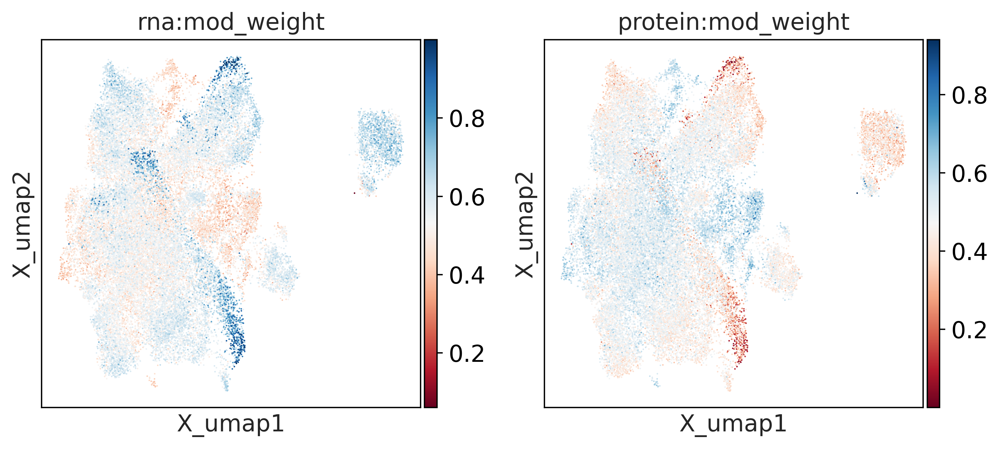

In [54]:
mu.pl.umap(mdata, color=['rna:mod_weight', 'protein:mod_weight'], cmap='RdBu')

In [55]:
sc.tl.leiden(mdata, resolution=1.0, neighbors_key='wnn', key_added='leiden_wnn')

running Leiden clustering
    finished: found 26 clusters and added
    'leiden_wnn', the cluster labels (adata.obs, categorical) (0:00:33)


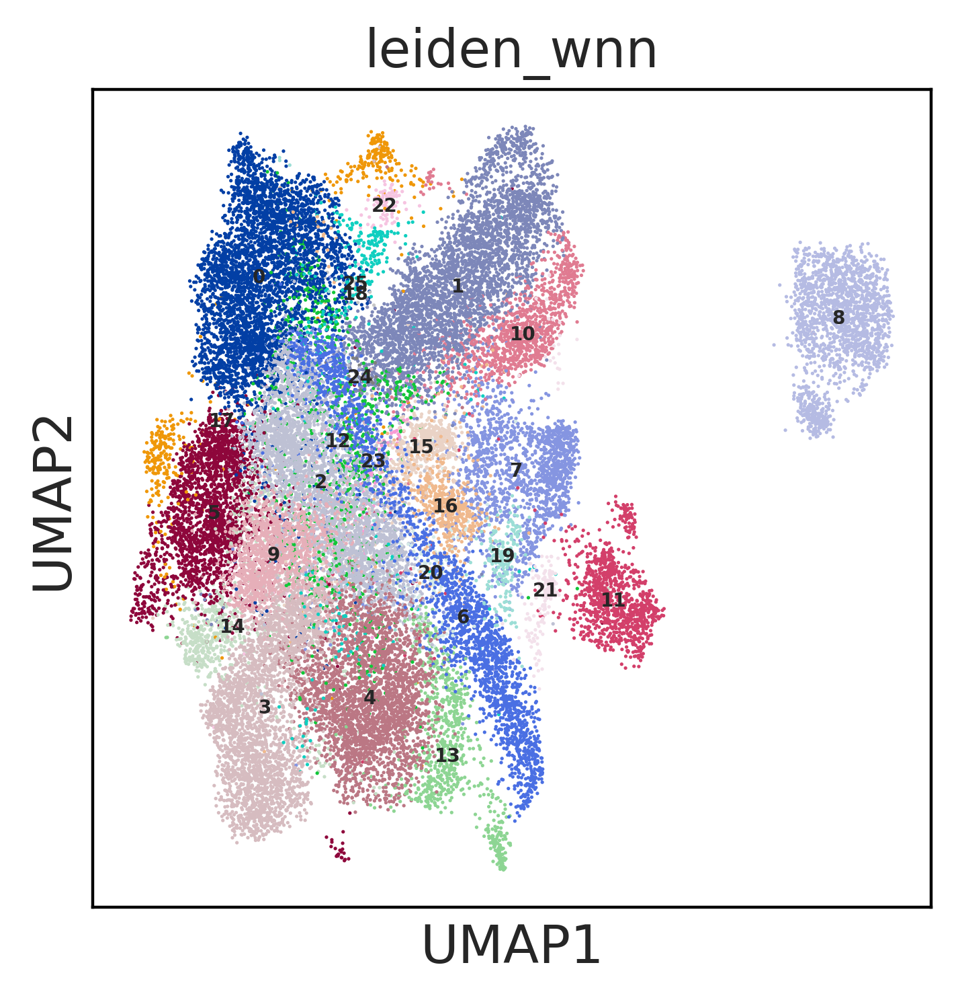

In [56]:
sc.pl.umap(mdata, color=['leiden_wnn'],ncols=2, legend_fontsize=5, legend_loc='on data')

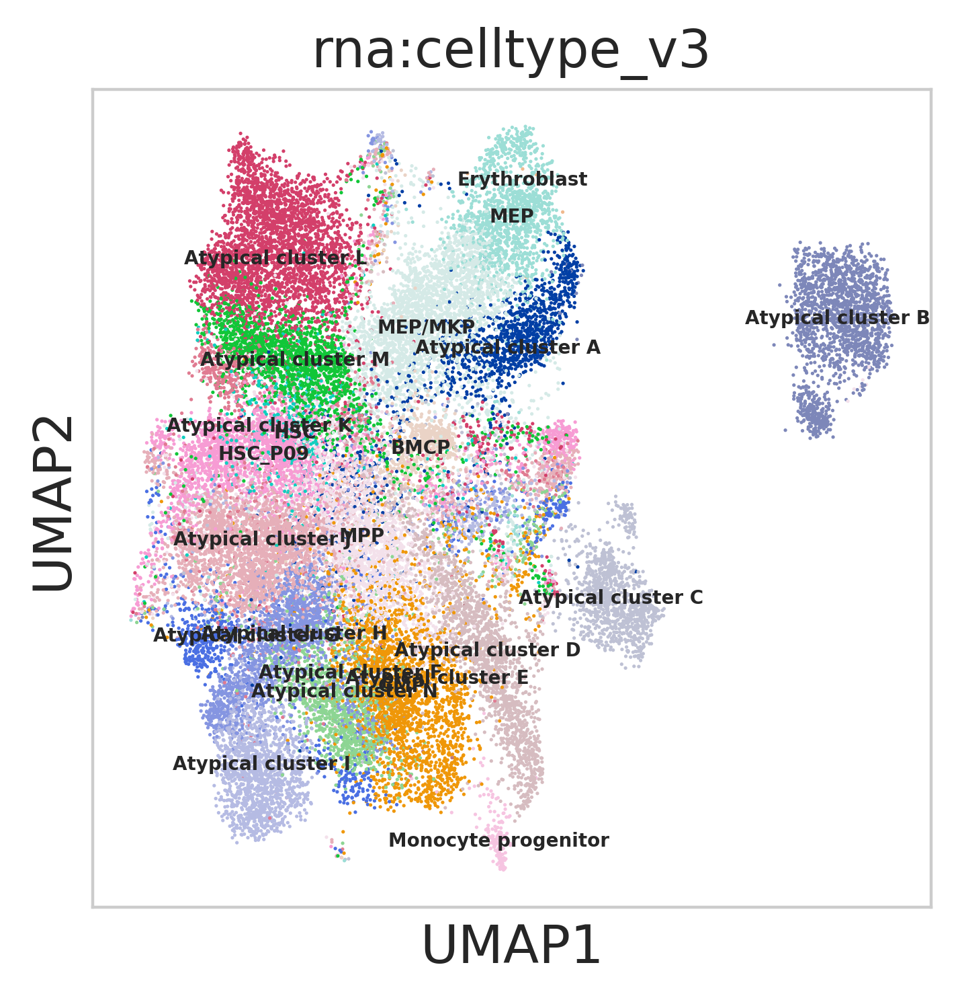

In [102]:
sc.pl.umap(mdata, color=['rna:celltype_v3'], legend_loc='on data', legend_fontsize=5)

In [106]:
df = mdata.obs[['leiden_wnn','rna:celltype_v3']].groupby(['leiden_wnn','rna:celltype_v3']).agg({'rna:celltype_v3': 'size'})
df['pct'] = 100* df['rna:celltype_v3'] / df.groupby('leiden_wnn')['rna:celltype_v3'].transform('sum')
df = df.sort_values(['leiden_wnn', 'pct'], ascending=[True, False])
df[df['pct'] > 1.0].to_csv('leiden_wnn_celltype_v3.csv', sep='\t')

<Axes: ylabel='rna:mod_weight'>

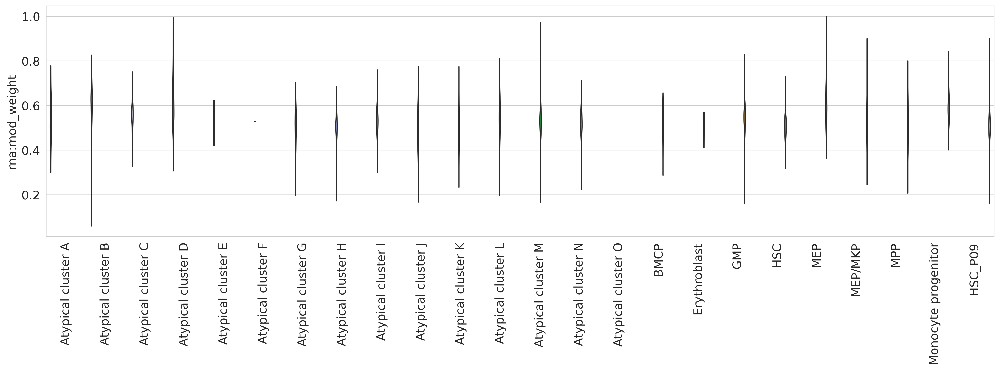

In [122]:
fig, ax = plt.subplots(1, 1, figsize=(20, 5))
sc.pl.violin(mdata, groupby='rna:celltype_v3', keys=['rna:mod_weight'], 
stripplot=False, scale='count',
rotation=90, ax=ax, show=False)

<Axes: ylabel='protein:mod_weight'>

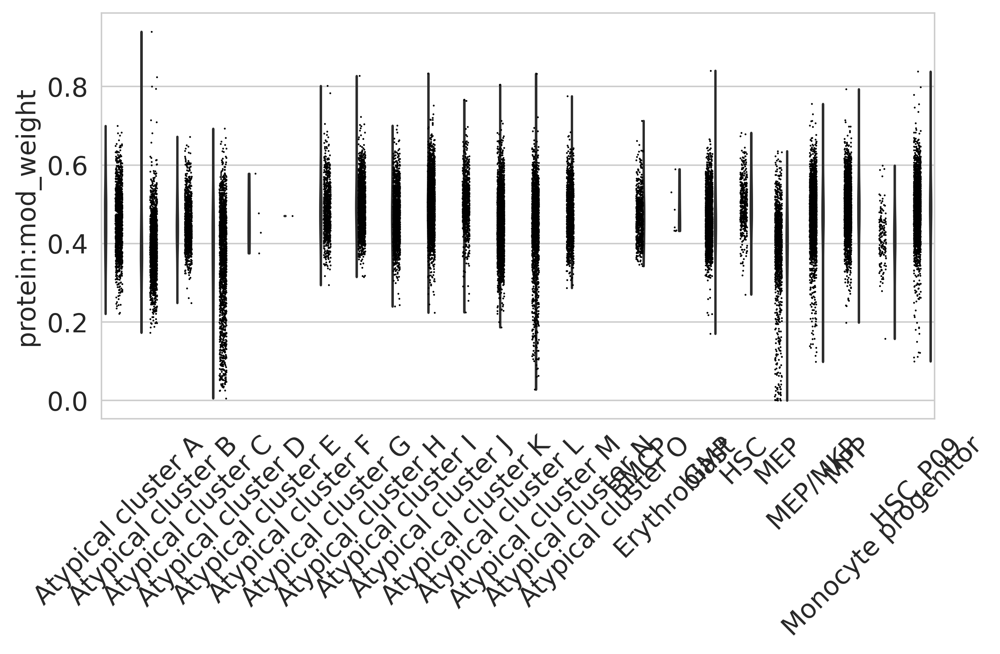

In [104]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sc.pl.violin(mdata, groupby='rna:celltype_v3', keys=['protein:mod_weight'], rotation=45, ax=ax, show=False)

In [57]:
#calculate similarity metrics
wnn_ari = adjusted_rand_score(mdata['rna'].obs['celltype_v3'], mdata.obs['leiden_wnn'])
wnn_ami = adjusted_mutual_info_score(mdata['rna'].obs['celltype_v3'], mdata.obs['leiden_wnn'])
wnn_vm = v_measure_score(mdata['rna'].obs['celltype_v3'], mdata.obs['leiden_wnn'])
print("ARI:", wnn_ari)
print("AMI:", wnn_ami)
print("VM:", wnn_vm)


ARI: 0.44265454232021595
AMI: 0.5725895227342992
VM: 0.5737518979438618


In [61]:
# calculate cross tab
wnn_ct = pd.crosstab(mdata['rna'].obs['celltype_v3'], mdata.obs['leiden_wnn'])
wnn_ct = wnn_ct.div(wnn_ct.sum(axis=1), axis=0)
wnn_ct

leiden_wnn,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
celltype_v3,,,,,,,,,,,,,,,,,,,,,
Atypical cluster A,0.003605,0.024513,0.120404,0.008652,0.007931,0.000000,0.000000,0.039654,0.00000,0.005047,...,0.010094,0.003605,0.007931,0.000000,0.000721,0.000721,0.002884,0.004326,0.000000,0.000000
Atypical cluster B,0.000000,0.000000,0.000000,0.000000,0.000571,0.000571,0.000000,0.000571,0.98972,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000571,0.000000,0.000000,0.000000,0.000571
Atypical cluster C,0.000000,0.000000,0.003487,0.000000,0.003487,0.006103,0.000000,0.012206,0.00000,0.000000,...,0.015693,0.001744,0.006103,0.001744,0.000000,0.001744,0.000000,0.001744,0.000000,0.000000
Atypical cluster D,0.000000,0.000000,0.020118,0.000000,0.009467,0.000000,0.900592,0.002959,0.00000,0.000592,...,0.001775,0.000000,0.008284,0.022485,0.000592,0.023669,0.000000,0.000000,0.000000,0.000000
Atypical cluster E,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Atypical cluster F,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Atypical cluster G,0.001200,0.000000,0.027611,0.022809,0.152461,0.025210,0.000000,0.142857,0.00000,0.000000,...,0.024010,0.042017,0.001200,0.000000,0.000000,0.000000,0.000000,0.002401,0.000000,0.000000
Atypical cluster H,0.000499,0.005991,0.005991,0.652022,0.100349,0.013480,0.000000,0.059411,0.00000,0.008487,...,0.020969,0.015477,0.006490,0.000000,0.000499,0.000499,0.006490,0.007988,0.000000,0.000499
Atypical cluster I,0.000616,0.000000,0.001848,0.855206,0.003697,0.014171,0.001232,0.048059,0.00000,0.001232,...,0.028959,0.013555,0.010474,0.000000,0.003697,0.000000,0.002465,0.001232,0.000000,0.000000


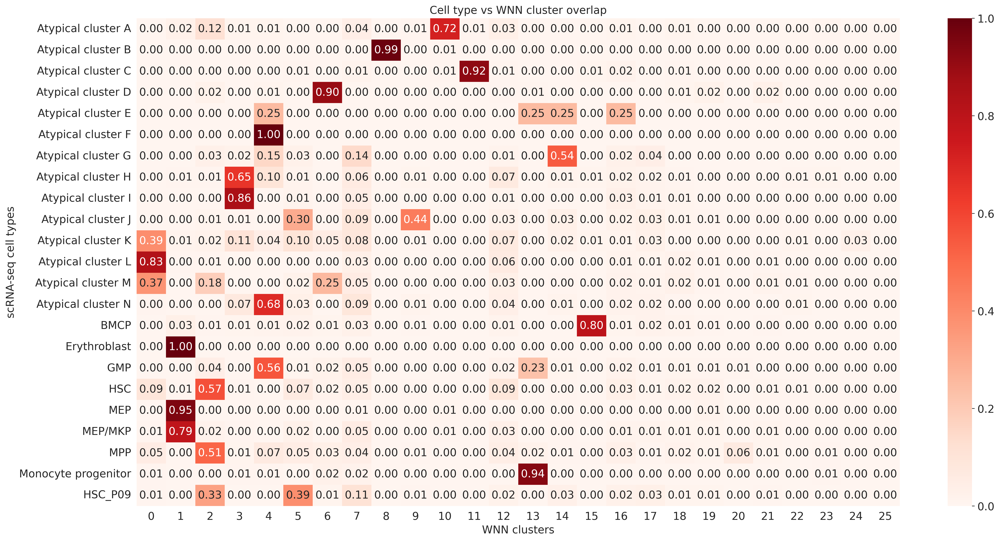

In [62]:
#plot as heatmap
sns.set_style("whitegrid")
plt.figure(figsize=(20, 10))
sns.heatmap(wnn_ct, annot=True, fmt=".2f", cmap="Reds")
plt.ylabel("scRNA-seq cell types")
plt.xlabel("WNN clusters")
plt.title("Cell type vs WNN cluster overlap")
plt.tight_layout()
plt.show()

# MOFA

In [2]:
mdata2 = mu.read_h5mu("21052025_mdata_rna_protein_cnv.h5mu")

In [3]:
mdata2

MuData object with n_obs × n_vars = 33629 × 31278
  uns:	'mofa'
  obsm:	'X_mofa'
  varm:	'LFs'
  3 modalities
    rna:	33629 x 28762
      obs:	'BARCODE', 'BEST', 'category', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'patient', 'dataset_name', 'timepoint', 'disease_state', 'outcome_C12D29', 'specific_outcome_C12D29', 'dataset', 'celltype', 'barcode', 'celltype_group', 'outcome_C6D28', 'specific_outcome_C6D28', 'timepoint_coarse', 'leiden', 'new_celltype', 'patient_alias', 'leiden_and_celltype', 'chr17_76736877_G_A_call', 'chr17_76736877_G_A_mut', 'chr17_76736877_G_C_call', 'chr17_76736877_G_C_mut', 'chr17_76736877_G_T_call', 'chr17_76736877_G_T_mut', 'chr17_7674250_C_T_call', 'chr17_7674250_C_T_mut', 'chr17_7675082_G_T_call', 'chr17_7675082_G_T_mut', 'chr17_7676051_G_C_call', 'chr17_7676051_G_C_mut', 'infercnv_new_celltype', 'inflammation_score', 'LSC17_score', 'cell_cycle_score', 'S_score', 'G2M_score', 'phase', 'celltype_v2', 'Apoptosis_score'
      var:	'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'chromosome', 'gene', 'start', 'end'
      uns:	'celltype_colors', 'celltype_v2_colors', 'cnv', 'dataset_colors', 'disease_state_colors', 'hvg', 'infercnv_new_celltype_colors', 'leiden', 'leiden_and_celltype_colors', 'leiden_colors', 'neighbors', 'new_celltype_colors', 'outcome_C12D29_colors', 'outcome_C6D28_colors', 'outcome_C6D8', 'outcome_C6D8_colors', 'patient_alias_colors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'rank_genes_groups_outcomeC6D28', 'umap'
      obsm:	'X_cnv', 'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    protein:	33629 x 272
      obs:	'dataset'
      var:	'highly_variable'
      obsm:	'X_pca', 'X_umap'
      layers:	'counts'
    cnv:	33629 x 2244
      obs:	'BARCODE', 'BEST', 'category', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'patient', 'dataset_name', 'timepoint', 'disease_state', 'outcome_C12D29', 'specific_outcome_C12D29', 'dataset', 'celltype', 'barcode', 'celltype_group', 'outcome_C6D28', 'specific_outcome_C6D28', 'timepoint_coarse', 'leiden', 'new_celltype', 'patient_alias', 'leiden_and_celltype', 'chr17_76736877_G_A_call', 'chr17_76736877_G_A_mut', 'chr17_76736877_G_C_call', 'chr17_76736877_G_C_mut', 'chr17_76736877_G_T_call', 'chr17_76736877_G_T_mut', 'chr17_7674250_C_T_call', 'chr17_7674250_C_T_mut', 'chr17_7675082_G_T_call', 'chr17_7675082_G_T_mut', 'chr17_7676051_G_C_call', 'chr17_7676051_G_C_mut', 'infercnv_new_celltype', 'inflammation_score', 'LSC17_score', 'cell_cycle_score', 'S_score', 'G2M_score', 'phase', 'celltype_v2', 'Apoptosis_score'

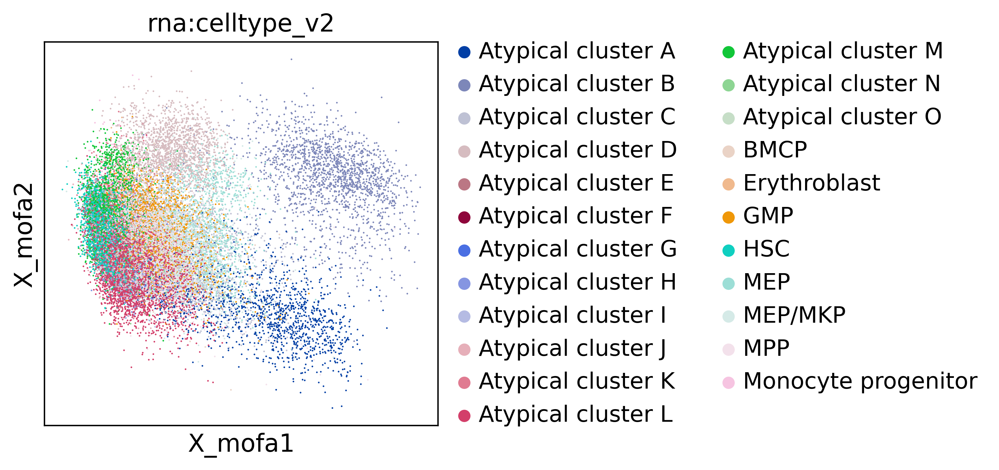

In [4]:
mu.pl.mofa(mdata2, color="rna:celltype_v2")

In [5]:
sc.pp.neighbors(mdata2, use_rep='X_mofa', key_added="mofa")

computing neighbors
    finished: added to `.uns['mofa']`
    `.obsp['mofa_distances']`, distances for each pair of neighbors
    `.obsp['mofa_connectivities']`, weighted adjacency matrix (0:00:22)


In [6]:
sc.tl.umap(mdata2, min_dist=.2, random_state=1, neighbors_key='mofa')
sc.tl.leiden(mdata2, resolution=.3, neighbors_key='mofa', key_added='leiden_mofa')

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:21)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_mofa', the cluster labels (adata.obs, categorical) (0:00:21)


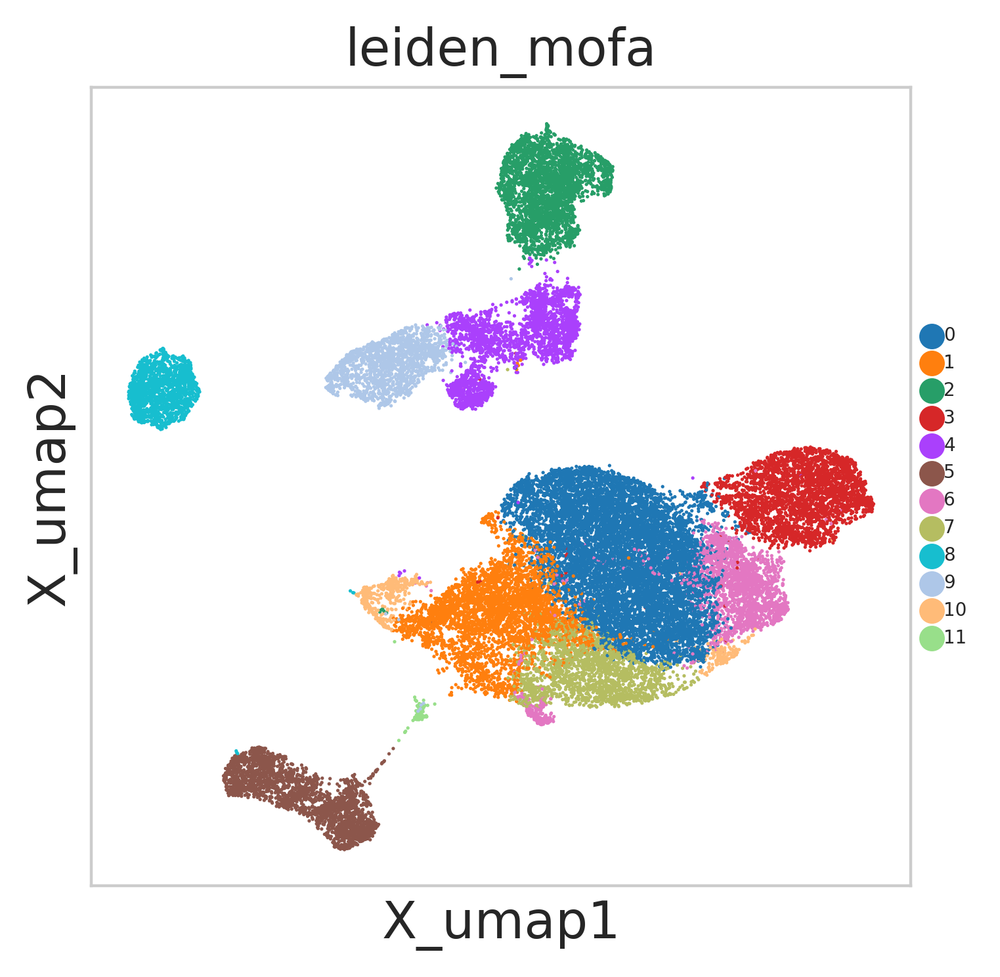

In [23]:
mu.pl.umap(mdata2, 
    color=['leiden_mofa'], 
    legend_fontsize=5)

In [78]:
mdata2.obs['patient_alias'] = mdata2['rna'].obs['patient_alias'].copy()
mdata2

MuData object with n_obs × n_vars = 33629 × 31278
  obs:	'leiden_mofa', 'patient_alias'
  uns:	'mofa', 'umap', 'leiden_mofa', 'leiden_mofa_colors'
  obsm:	'X_mofa', 'X_umap'
  varm:	'LFs'
  obsp:	'mofa_distances', 'mofa_connectivities'
  3 modalities
    rna:	33629 x 28762
      obs:	'BARCODE', 'BEST', 'category', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'patient', 'dataset_name', 'timepoint', 'disease_state', 'outcome_C12D29', 'specific_outcome_C12D29', 'dataset', 'celltype', 'barcode', 'celltype_group', 'outcome_C6D28', 'specific_outcome_C6D28', 'timepoint_coarse', 'leiden', 'new_celltype', 'patient_alias', 'leiden_and_celltype', 'chr17_76736877_G_A_call', 'chr17_76736877_G_A_mut', 'chr17_76736877_G_C_call', 'chr17_76736877_G_C_mut', 'chr17_76736877_G_T_call', 'chr17_76736877_G_T_mut', 'chr17_7674250_C_T_call', 'chr17_7674250_C_T_mut', 'chr17_7675082_G_T_call', 'chr17_7675082_G_T_mut', 'chr17_7676051_G_C_call', 'chr17_7676051_G_C_mut', 'infercnv_new_celltype', 'inflammation_score', 'LSC17_score', 'cell_cycle_score', 'S_score', 'G2M_score', 'phase', 'celltype_v2', 'Apoptosis_score'
      var:	'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'chromosome', 'gene', 'start', 'end'
      uns:	'celltype_colors', 'celltype_v2_colors', 'cnv', 'dataset_colors', 'disease_state_colors', 'hvg', 'infercnv_new_celltype_colors', 'leiden', 'leiden_and_celltype_colors', 'leiden_colors', 'neighbors', 'new_celltype_colors', 'outcome_C12D29_colors', 'outcome_C6D28_colors', 'outcome_C6D8', 'outcome_C6D8_colors', 'patient_alias_colors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'rank_genes_groups_outcomeC6D28', 'umap'
      obsm:	'X_cnv', 'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    protein:	33629 x 272
      obs:	'dataset', 'leiden_citeseq'
      var:	'highly_variable'
      uns:	'citeseq', 'leiden_citeseq', 'umap'
      obsm:	'X_pca', 'X_umap'
      layers:	'counts'
      obsp:	'citeseq_distances', 'citeseq_connectivities'
    cnv:	33629 x 2244
      obs:	'BARCODE', 'BEST', 'category', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'patient', 'dataset_name', 'timepoint', 'disease_state', 'outcome_C12D29', 'specific_outcome_C12D29', 'dataset', 'celltype', 'barcode', 'celltype_group', 'outcome_C6D28', 'specific_outcome_C6D28', 'timepoint_coarse', 'leiden', 'new_celltype', 'patient_alias', 'leiden_and_celltype', 'chr17_76736877_G_A_call', 'chr17_76736877_G_A_mut', 'chr17_76736877_G_C_call', 'chr17_76736877_G_C_mut', 'chr17_76736877_G_T_call', 'chr17_76736877_G_T_mut', 'chr17_7674250_C_T_call', 'chr17_7674250_C_T_mut', 'chr17_7675082_G_T_call', 'chr17_7675082_G_T_mut', 'chr17_7676051_G_C_call', 'chr17_7676051_G_C_mut', 'infercnv_new_celltype', 'inflammation_score', 'LSC17_score', 'cell_cycle_score', 'S_score', 'G2M_score', 'phase', 'celltype_v2', 'Apoptosis_score'

In [85]:
mdata2.mod['rna'].obsm['X_mofa_umap'] = mdata2.obsm['X_umap'].copy()
mdata2

MuData object with n_obs × n_vars = 33629 × 31278
  obs:	'leiden_mofa', 'patient_alias'
  uns:	'mofa', 'umap', 'leiden_mofa', 'leiden_mofa_colors'
  obsm:	'X_mofa', 'X_umap'
  varm:	'LFs'
  obsp:	'mofa_distances', 'mofa_connectivities'
  3 modalities
    rna:	33629 x 28762
      obs:	'BARCODE', 'BEST', 'category', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'patient', 'dataset_name', 'timepoint', 'disease_state', 'outcome_C12D29', 'specific_outcome_C12D29', 'dataset', 'celltype', 'barcode', 'celltype_group', 'outcome_C6D28', 'specific_outcome_C6D28', 'timepoint_coarse', 'leiden', 'new_celltype', 'patient_alias', 'leiden_and_celltype', 'chr17_76736877_G_A_call', 'chr17_76736877_G_A_mut', 'chr17_76736877_G_C_call', 'chr17_76736877_G_C_mut', 'chr17_76736877_G_T_call', 'chr17_76736877_G_T_mut', 'chr17_7674250_C_T_call', 'chr17_7674250_C_T_mut', 'chr17_7675082_G_T_call', 'chr17_7675082_G_T_mut', 'chr17_7676051_G_C_call', 'chr17_7676051_G_C_mut', 'infercnv_new_celltype', 'inflammation_score', 'LSC17_score', 'cell_cycle_score', 'S_score', 'G2M_score', 'phase', 'celltype_v2', 'Apoptosis_score'
      var:	'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'chromosome', 'gene', 'start', 'end'
      uns:	'celltype_colors', 'celltype_v2_colors', 'cnv', 'dataset_colors', 'disease_state_colors', 'hvg', 'infercnv_new_celltype_colors', 'leiden', 'leiden_and_celltype_colors', 'leiden_colors', 'neighbors', 'new_celltype_colors', 'outcome_C12D29_colors', 'outcome_C6D28_colors', 'outcome_C6D8', 'outcome_C6D8_colors', 'patient_alias_colors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'rank_genes_groups_outcomeC6D28', 'umap'
      obsm:	'X_cnv', 'X_pca', 'X_umap', 'X_mofa_umap'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    protein:	33629 x 272
      obs:	'dataset', 'leiden_citeseq'
      var:	'highly_variable'
      uns:	'citeseq', 'leiden_citeseq', 'umap'
      obsm:	'X_pca', 'X_umap'
      layers:	'counts'
      obsp:	'citeseq_distances', 'citeseq_connectivities'
    cnv:	33629 x 2244
      obs:	'BARCODE', 'BEST', 'category', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'patient', 'dataset_name', 'timepoint', 'disease_state', 'outcome_C12D29', 'specific_outcome_C12D29', 'dataset', 'celltype', 'barcode', 'celltype_group', 'outcome_C6D28', 'specific_outcome_C6D28', 'timepoint_coarse', 'leiden', 'new_celltype', 'patient_alias', 'leiden_and_celltype', 'chr17_76736877_G_A_call', 'chr17_76736877_G_A_mut', 'chr17_76736877_G_C_call', 'chr17_76736877_G_C_mut', 'chr17_76736877_G_T_call', 'chr17_76736877_G_T_mut', 'chr17_7674250_C_T_call', 'chr17_7674250_C_T_mut', 'chr17_7675082_G_T_call', 'chr17_7675082_G_T_mut', 'chr17_7676051_G_C_call', 'chr17_7676051_G_C_mut', 'infercnv_new_celltype', 'inflammation_score', 'LSC17_score', 'cell_cycle_score', 'S_score', 'G2M_score', 'phase', 'celltype_v2', 'Apoptosis_score'

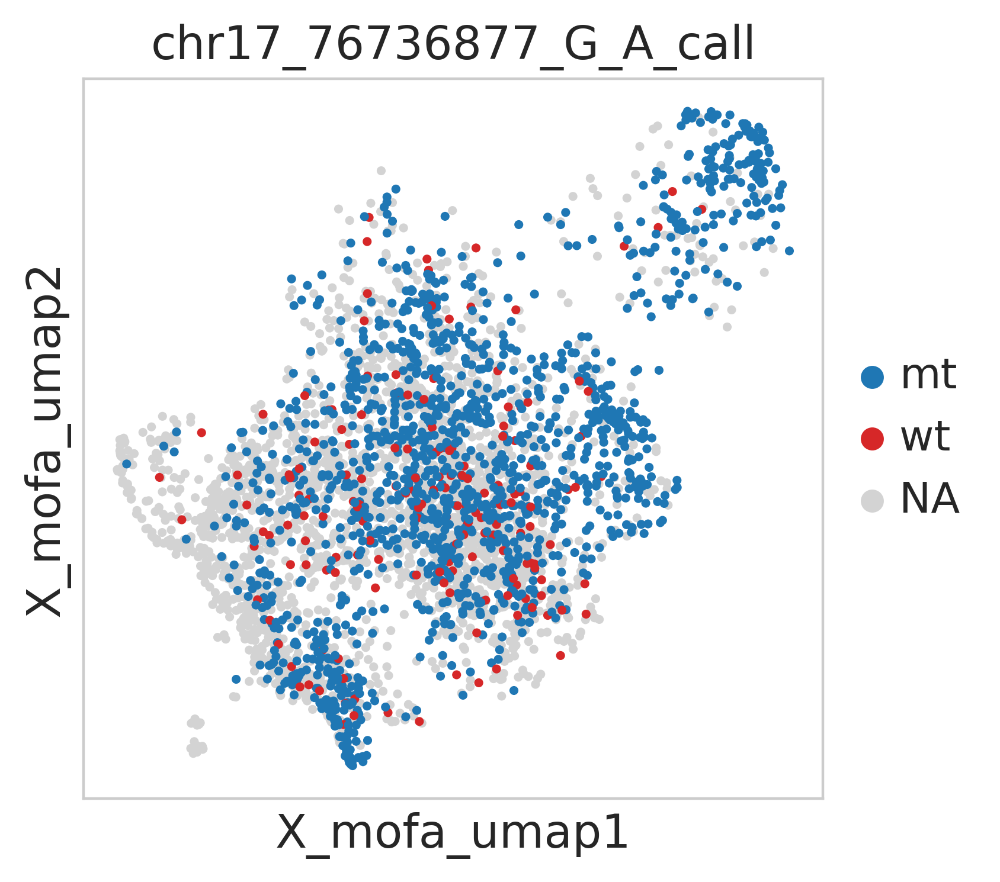

In [90]:
mu.pl.embedding(mdata2['rna'][mdata2['rna'].obs['patient_alias'] == "P02"], 
basis='X_mofa_umap', 
color='chr17_76736877_G_A_call',
groups=['mt','wt'])

In [63]:
healthy_ct = ['HSC', 'GMP', 'MEP/MKP', 'MPP', 'MEP', 'Monocyte progenitor', 'BMCP', 'Erythroblast']

In [64]:
atypical_ct = ['Atypical cluster A', 'Atypical cluster B', 'Atypical cluster C',
'Atypical cluster D', 'Atypical cluster E', 'Atypical cluster F',
'Atypical cluster G', 'Atypical cluster H', 'Atypical cluster I',
'Atypical cluster J', 'Atypical cluster K', 'Atypical cluster L',
'Atypical cluster M', 'Atypical cluster N']

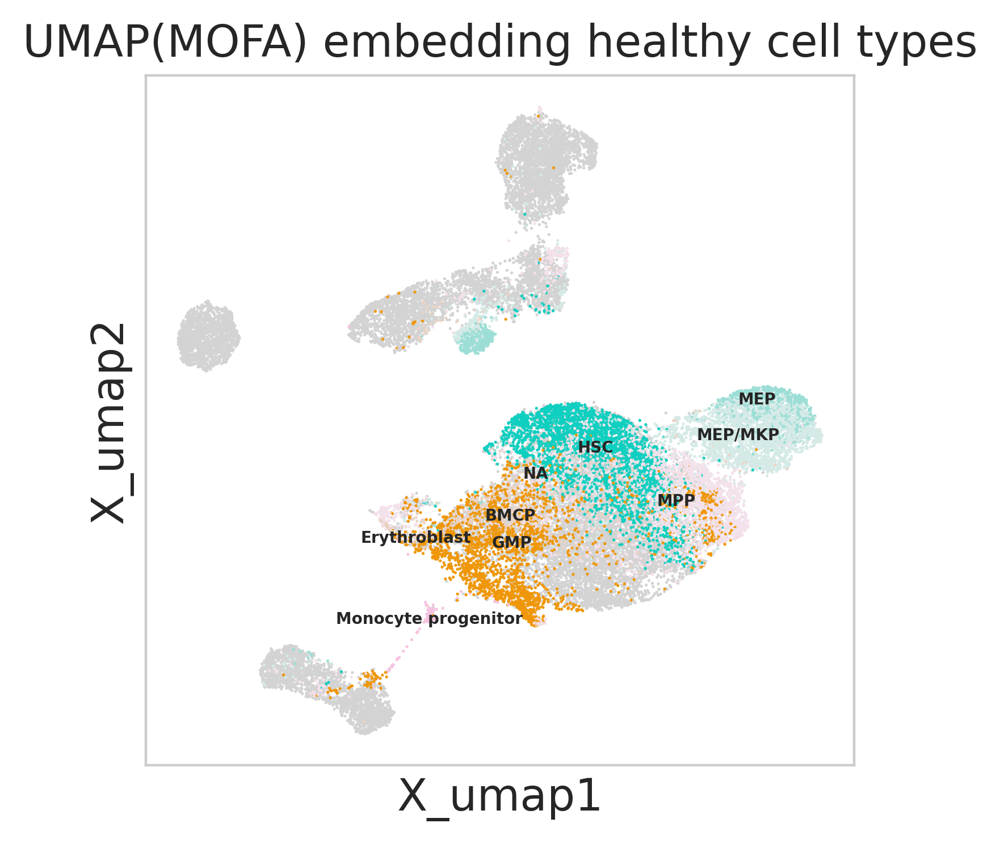

In [100]:
mu.pl.umap(mdata2, 
    color=['rna:celltype_v2'], 
    title="UMAP(MOFA) embedding healthy cell types",
    groups=healthy_ct,
    legend_loc='on data',
    legend_fontsize=5)

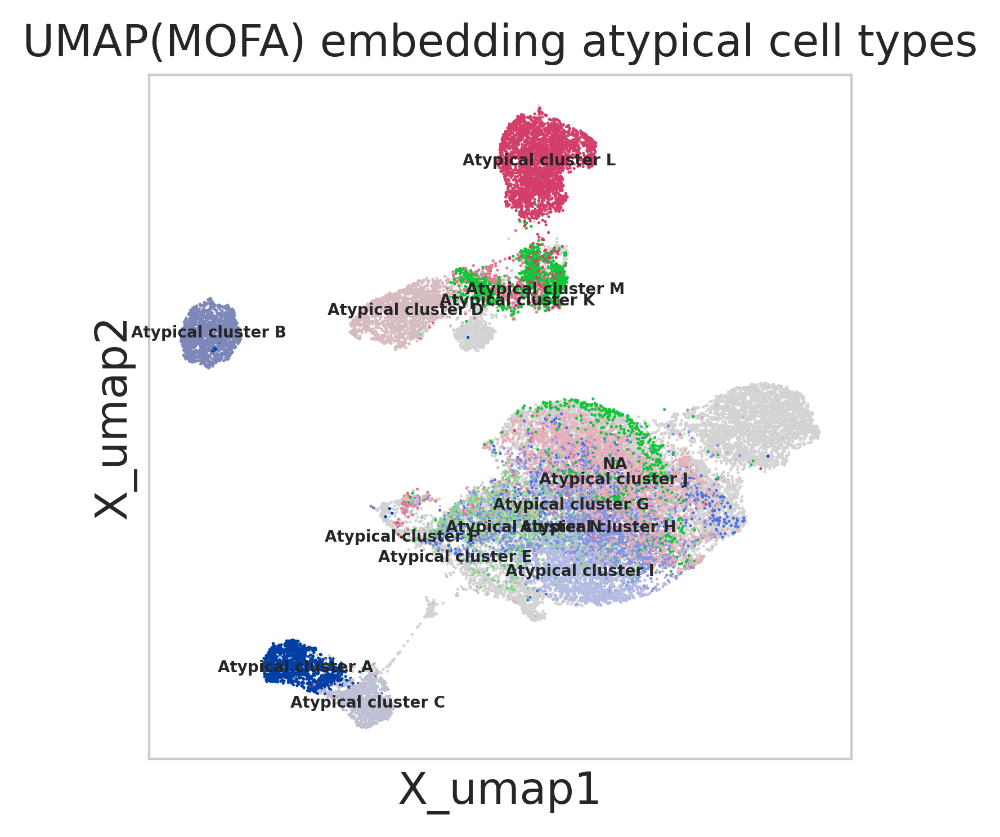

In [92]:
mu.pl.umap(mdata2, 
    color=['rna:celltype_v2'], 
    title="UMAP(MOFA) embedding atypical cell types",
    groups=atypical_ct,
    legend_loc='on data',
    legend_fontsize=5)

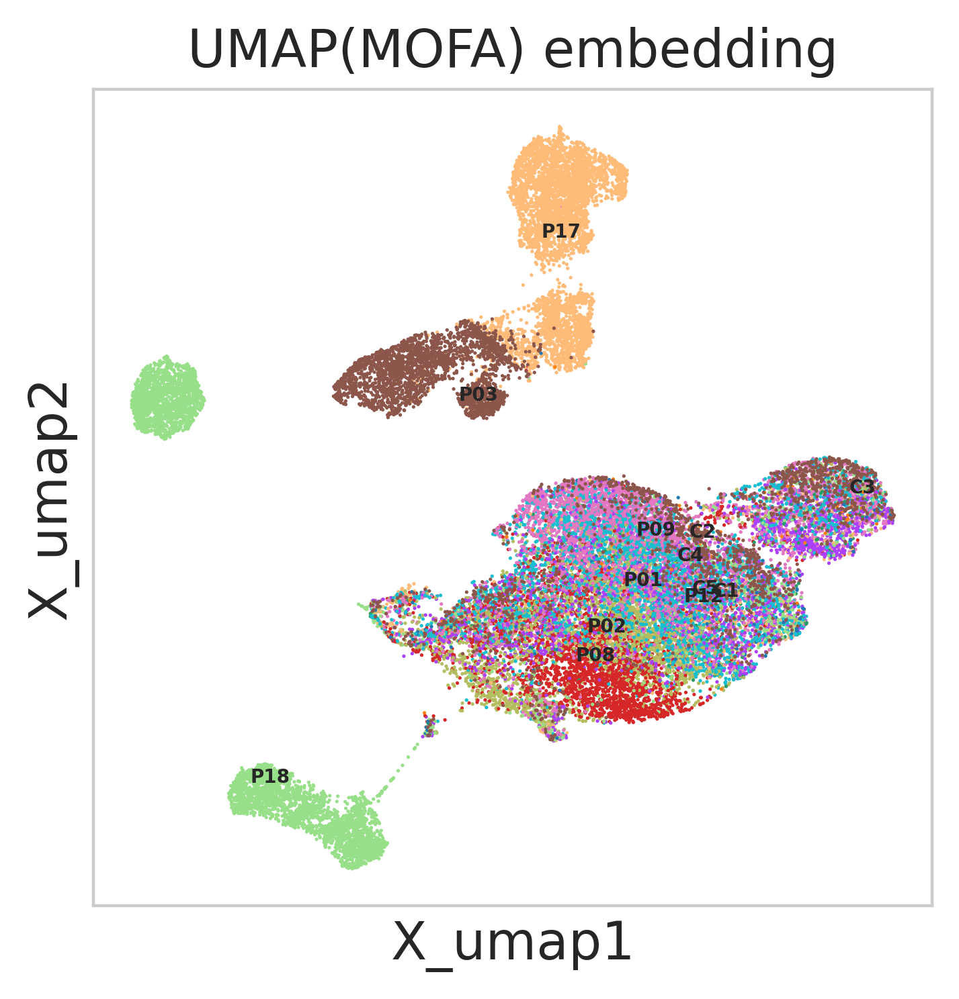

In [101]:
mu.pl.umap(mdata2, 
    color=['rna:patient_alias'], 
    title="UMAP(MOFA) embedding",
    legend_loc='on data',
    legend_fontsize=5)

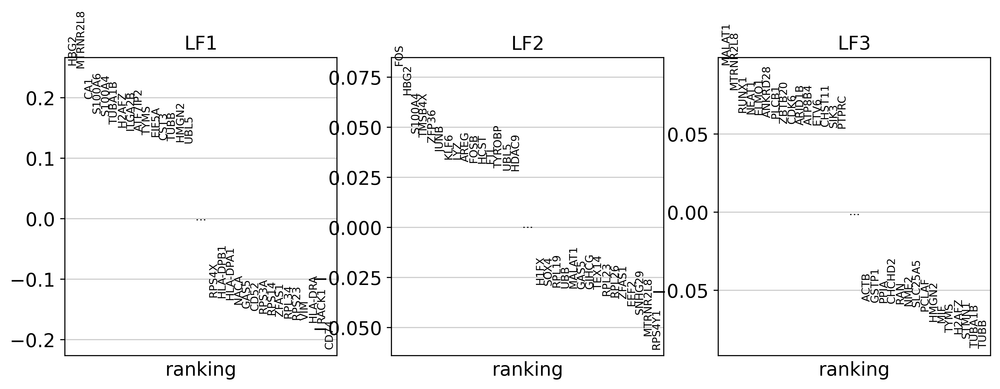

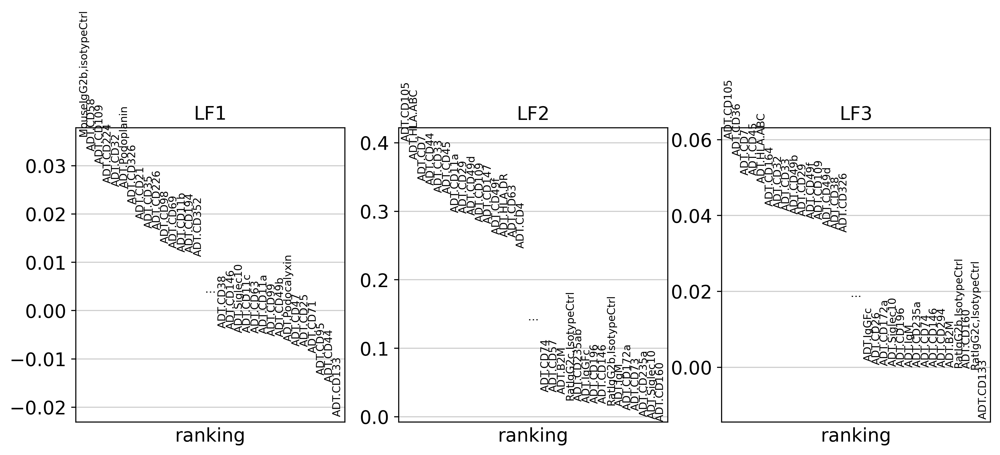

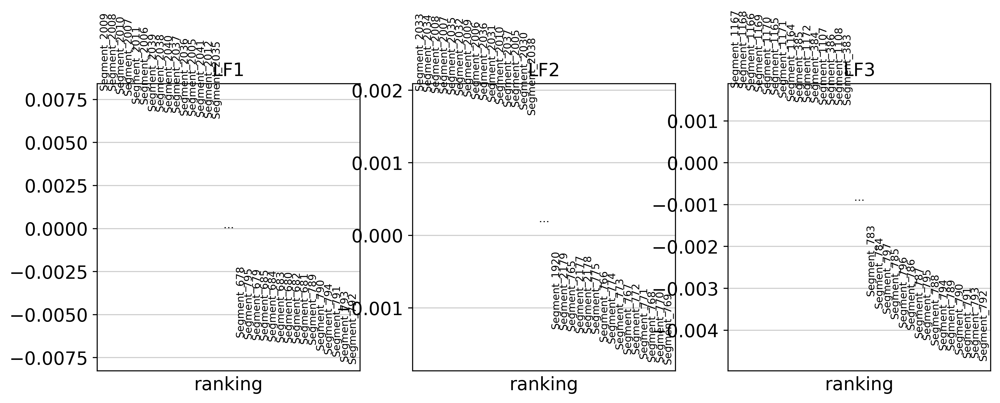

In [9]:
mu.pl.mofa_loadings(mdata2)

# Clustering similarity metrics with MOFA

In [10]:
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score, v_measure_score

In [11]:
ari = adjusted_rand_score(mdata2['rna'].obs['celltype_v2'], mdata2.obs['leiden_mofa'])
ami = adjusted_mutual_info_score(mdata2['rna'].obs['celltype_v2'], mdata2.obs['leiden_mofa'])
vm = v_measure_score(mdata2['rna'].obs['celltype_v2'], mdata2.obs['leiden_mofa'])
print("ARI:", ari)
print("AMI:", ami)
print("VM:", vm)

ARI: 0.3793903078809663
AMI: 0.6004373016810755
VM: 0.600963896622458


In [17]:
# Visualize overlap

ct = pd.crosstab(mdata2['rna'].obs['celltype_v2'], mdata2.obs['leiden_mofa'])
ct = ct.div(ct.sum(axis=1), axis=0)
ct


leiden_mofa,0,1,2,3,4,5,6,7,8,9,10,11
celltype_v2,,,,,,,,,,,,
Atypical cluster A,0.001442,0.000721,0.000000,0.000721,0.000721,0.985580,0.000000,0.000000,0.007931,0.000000,0.002884,0.000000
Atypical cluster B,0.000000,0.000571,0.000000,0.000000,0.000000,0.001713,0.000000,0.000571,0.996573,0.000000,0.000571,0.000000
Atypical cluster C,0.000000,0.000872,0.000000,0.000000,0.000000,0.997384,0.000000,0.000872,0.000000,0.000000,0.000872,0.000000
Atypical cluster D,0.019527,0.010651,0.000000,0.000000,0.020710,0.000000,0.003550,0.010059,0.000000,0.934320,0.001183,0.000000
Atypical cluster E,0.000000,0.750000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Atypical cluster F,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
Atypical cluster G,0.481393,0.338535,0.000000,0.000000,0.000000,0.000000,0.158463,0.016807,0.000000,0.000000,0.004802,0.000000
Atypical cluster H,0.673989,0.174738,0.000000,0.002996,0.001997,0.000000,0.035946,0.096355,0.000000,0.000000,0.013979,0.000000
Atypical cluster I,0.148490,0.033888,0.000616,0.000616,0.004929,0.000000,0.000000,0.805299,0.000000,0.000000,0.006161,0.000000


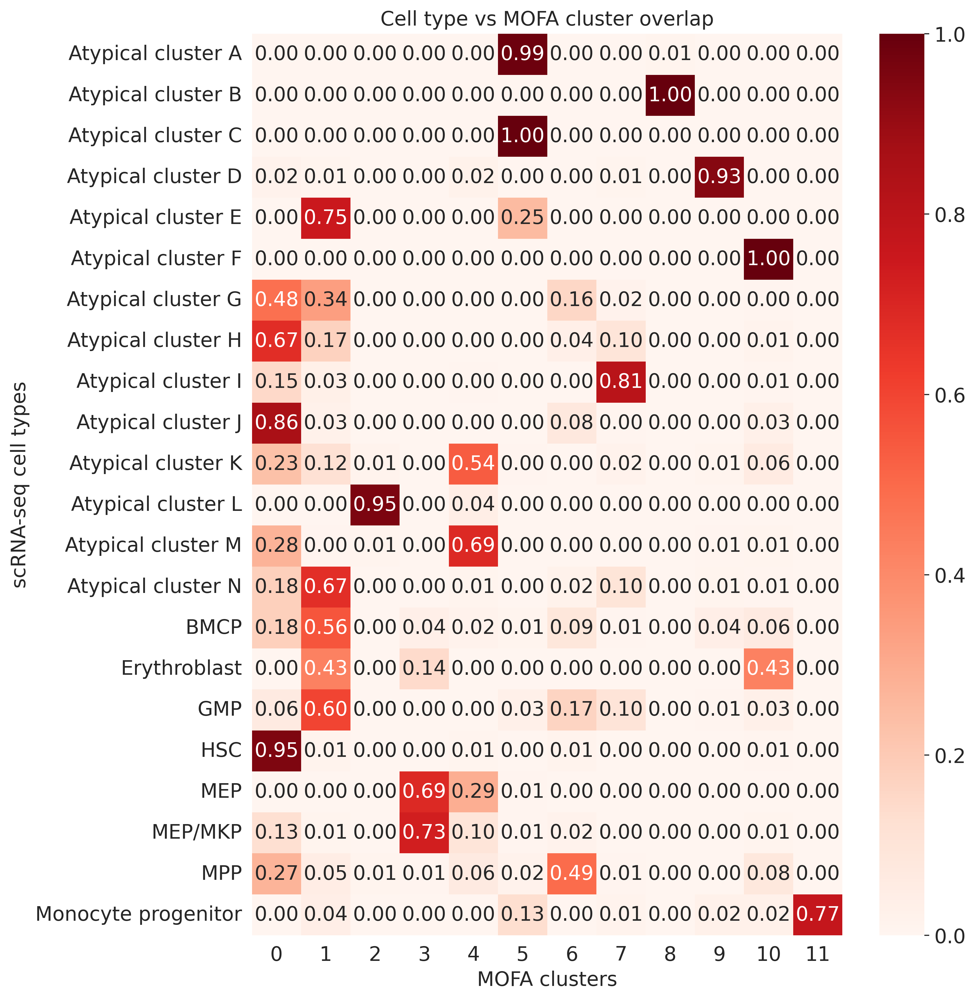

In [27]:
#plot as heatmap
sns.set_style("whitegrid")
plt.figure(figsize=(10, 10))
sns.heatmap(ct, annot=True, fmt=".2f", cmap="Reds")
plt.ylabel("scRNA-seq cell types")
plt.xlabel("MOFA clusters")
plt.title("Cell type vs MOFA cluster overlap")
plt.tight_layout()
plt.show()

# Clustering similarity metrics with CITE-seq

In [31]:
sc.pp.neighbors(mdata2.mod['protein'], key_added='citeseq')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['citeseq']`
    `.obsp['citeseq_distances']`, distances for each pair of neighbors
    `.obsp['citeseq_connectivities']`, weighted adjacency matrix (0:00:05)


In [39]:
sc.tl.umap(mdata2.mod['protein'], min_dist=.2, random_state=1, neighbors_key='citeseq')
sc.tl.leiden(mdata2.mod['protein'], resolution=.3, neighbors_key='citeseq', key_added='leiden_citeseq')

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:22)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden_citeseq', the cluster labels (adata.obs, categorical) (0:00:14)


In [42]:
mdata2['protein'].obs['leiden_citeseq'].value_counts()

leiden_citeseq
0     3091
1     2983
2     2952
3     2026
4     1880
5     1750
6     1682
7     1573
8     1565
9     1556
10    1475
11    1378
12    1311
13    1249
14    1200
15     954
16     853
17     777
18     765
19     744
20     595
21     402
22     382
23     234
24     228
25      24
Name: count, dtype: int64

In [40]:
ari2 = adjusted_rand_score(mdata2['rna'].obs['celltype_v2'], mdata2['protein'].obs['leiden_citeseq'])
ami2 = adjusted_mutual_info_score(mdata2['rna'].obs['celltype_v2'], mdata2['protein'].obs['leiden_citeseq'])
vm2 = v_measure_score(mdata2['rna'].obs['celltype_v2'], mdata2['protein'].obs['leiden_citeseq'])
print("ARI:", ari2)
print("AMI:", ami2)
print("VM:", vm2)

ARI: 0.0272382824348028
AMI: 0.09198013778743049
VM: 0.09425415294976089


In [44]:
# Visualize overlap

ct2 = pd.crosstab(mdata2['rna'].obs['celltype_v2'], mdata2['protein'].obs['leiden_citeseq'])
ct2 = ct2.div(ct2.sum(axis=1), axis=0)
ct2

leiden_citeseq,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
celltype_v2,,,,,,,,,,,,,,,,,,,,,
Atypical cluster A,0.000000,0.006489,0.000000,0.896179,0.000721,0.000721,0.000721,0.000000,0.000000,0.000000,...,0.000000,0.001442,0.000000,0.000721,0.046864,0.000000,0.000000,0.000000,0.001442,0.000000
Atypical cluster B,0.001713,0.000000,0.000000,0.010851,0.001142,0.000000,0.000000,0.001142,0.770988,0.000000,...,0.009709,0.000571,0.000000,0.000000,0.000000,0.000000,0.000000,0.133638,0.013706,0.000000
Atypical cluster C,0.000000,0.001744,0.003487,0.379250,0.000872,0.000000,0.000000,0.002616,0.000000,0.000872,...,0.001744,0.445510,0.000000,0.000000,0.121186,0.000000,0.000000,0.000000,0.000872,0.000000
Atypical cluster D,0.001183,0.021302,0.013018,0.000592,0.001183,0.000592,0.000592,0.000000,0.001183,0.000000,...,0.418935,0.000000,0.000000,0.315976,0.001183,0.001183,0.000000,0.000000,0.013018,0.000592
Atypical cluster E,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000
Atypical cluster F,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Atypical cluster G,0.038415,0.002401,0.001200,0.002401,0.002401,0.001200,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.002401,0.000000,0.001200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Atypical cluster H,0.440339,0.007988,0.004493,0.004493,0.000499,0.000999,0.000499,0.000000,0.009486,0.000499,...,0.000000,0.015976,0.000000,0.000000,0.000000,0.000000,0.001498,0.000000,0.000000,0.000000
Atypical cluster I,0.229205,0.014787,0.000616,0.001848,0.000616,0.001232,0.004929,0.000000,0.003081,0.000616,...,0.000000,0.006778,0.000000,0.000616,0.000000,0.001232,0.038201,0.000000,0.000000,0.000000


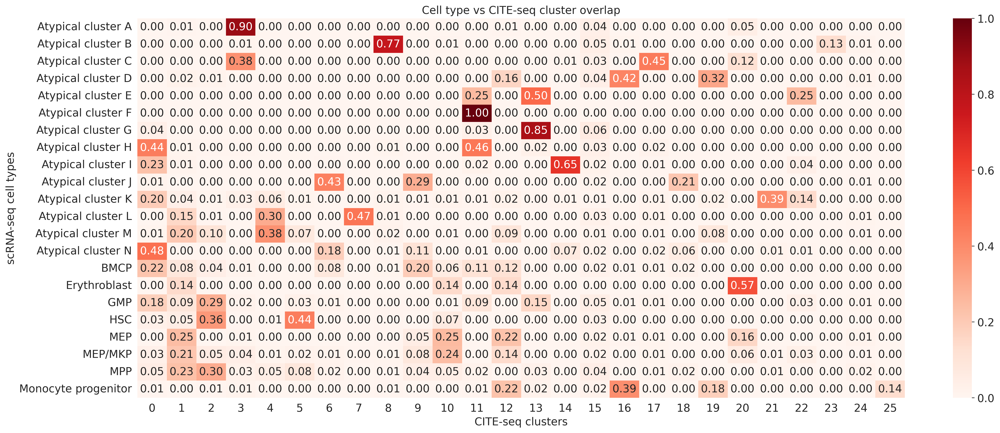

In [47]:
#plot as heatmap
sns.set_style("whitegrid")
plt.figure(figsize=(20, 8))
sns.heatmap(ct2, annot=True, fmt=".2f", cmap="Reds")
plt.ylabel("scRNA-seq cell types")
plt.xlabel("CITE-seq clusters")
plt.title("Cell type vs CITE-seq cluster overlap")
plt.tight_layout()
plt.show()